<a href="https://colab.research.google.com/github/RandDahmash/Mining-project/blob/main/Phase3Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1- Problem Statement:

The problem addressed in this project is understanding and predicting students’ adaptability levels in online education. As digital learning continues to expand, students differ widely in how well they adjust to online environments due to factors like learning style, study conditions, and access to technology.
This project aims to classify students into adaptability levels (Low, Moderate, High) and identify the patterns behind these differences. This is important because recognizing students who struggle early can help educators provide better support, improve online teaching strategies, and design more effective digital learning systems. Understanding adaptability directly contributes to improving learning outcomes in an education system that increasingly relies on online platforms

# 2-Data Mining Task:

The problem is formalized as a data mining task involving both classification and clustering.

**1. Classification Task**

The goal of the classification task is to predict the student’s Adaptivity Level in online education (Low, Moderate, High)
This helps determine which factors influence adaptability and allows us to automatically classify new students into the appropriate adaptability category.

**2. Clustering Task**

The clustering task aims to group students into natural clusters based on similarities in their learning conditions, environment, and behavior.
This is useful for discovering hidden patterns, identifying groups of students with similar adaptability characteristics, and assisting educators in designing targeted support strategies.

**Overall Task Definition**
By combining classification (supervised learning) and clustering (unsupervised learning), the project seeks to both predict adaptability levels and explore underlying patterns in student behavior supporting a deeper understanding of student needs in online learning environments.

# 3-Data:

#Project Goal:
The project's main goal is a classification and clustring task. We will build a machine learning model to predict a student's adaptability level in an online education environment. This will help identify the factors that influence whether a student will have a low, moderate, or high level of adaptability. The ultimate aim is to use these insights to help educational institutions and policymakers improve online learning resources and support systems.



# Data Source Link :
https://www.kaggle.com/datasets/mdmahmudulhasansuzan/students-adaptability-level-in-online-education

Data is from Kaggle


## Dataset Description
- Number and data types of attributes (features)  
- Number of records (instances)  
- Class attribute with its values and counts  
- Sample of the dataset

In [125]:
import pandas as pd
data=pd.read_csv('Raw_dataset.csv')



target="Adaptivity Level"
all_columns = list(data.columns)
feature_columns = [c for c in all_columns if c !=target]


print("Feature columns in the database:")
print(feature_columns)
print("\nData types of features:")
print(data[feature_columns].dtypes)



print("Number of columns [excluding class]=",len(feature_columns))
print("The class attribute is : ",target)
print("Number of columns [including class]=",len(all_columns))




numOfRecords = len(data)
print("Number of records:", numOfRecords)



print("Class attribute is ",target)
print("Counts/label:")
print(data[target].value_counts().to_frame())


print("Sample of the database")
print(data.head(5))


Feature columns in the database:
['Gender', 'Age', 'Education Level', 'Institution Type', 'IT Student', 'Location', 'Load-shedding', 'Financial Condition', 'Internet Type', 'Network Type', 'Class Duration', 'Self Lms', 'Device']

Data types of features:
Gender                 object
Age                    object
Education Level        object
Institution Type       object
IT Student             object
Location               object
Load-shedding          object
Financial Condition    object
Internet Type          object
Network Type           object
Class Duration         object
Self Lms               object
Device                 object
dtype: object
Number of columns [excluding class]= 13
The class attribute is :  Adaptivity Level
Number of columns [including class]= 14
Number of records: 1205
Class attribute is  Adaptivity Level
Counts/label:
                  count
Adaptivity Level       
Moderate            625
Low                 480
High                100
Sample of the database
 

In [126]:
print("label /Counts:")
for c in all_columns:
  print(data[c].value_counts().to_frame())

label /Counts:
        count
Gender       
Boy       663
Girl      542
        count
Age          
21-25     374
15-Nov    353
16-20     278
5-Jan      81
26-30      68
10-Jun     51
                 count
Education Level       
School             530
University         456
College            219
                  count
Institution Type       
Non Government      823
Government          382
            count
IT Student       
No            901
Yes           304
          count
Location       
Yes         935
No          270
               count
Load-shedding       
Low             1004
High             201
                     count
Financial Condition       
Mid                    878
Poor                   242
Rich                    85
               count
Internet Type       
Mobile Data      695
Wifi             510
              count
Network Type       
4G              775
3G              411
2G               19
                count
Class Duration       
3-Jan             840
6

# Class label

The target variable in this project is Adaptivity Level, which categorizes students into three classes based on how well they adapt to online learning:

Low – Students who struggle with online learning due to limited technology access, learning style mismatch, distractions, or weak online engagement.

Moderate – Students who adapt fairly well but may still face occasional challenges or require additional support.

High – Students who adapt extremely well, showing strong engagement, comfort with digital tools, and effective learning strategies in online environments.

Based on the dataset distribution:

Moderate: 51.9%

Low: 39.8%

High: 8.3%

This distribution shows that the class label is not balanced.

Most students fall into the Moderate and Low categories, while the High class is significantly smaller. This imbalance may affect model performance and should be considered during evaluation.



## Summary
The dataset contains 1,205 records and 14 attributes.  
The target variable is Adaptivity Level, which has three classes: Low, Moderate, High.  
This dataset description provides the foundation for building machine learning models in the next phases.

In [83]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier #Import Decision Tree Classifier
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

#Load the Dataset
df = pd.read_csv("https://raw.githubusercontent.com/RandDahmash/Mining-project/main/Dataset/Cleaned_dataset.csv")
df.head()



,Gender,Age,Education Level,Institution Type,IT Student,Location,Load-shedding,Financial Condition,Internet Type,Network Type,Class Duration,Self Lms,Device,Adaptivity Level
0,0,0.6,2,1,0,1,1,0,1,2,1,0,2,2
1,1,0.6,2,1,0,1,0,0,0,2,0,1,1,2
2,1,0.4,0,0,0,1,1,0,1,2,0,0,1,2
3,1,0.2,1,1,0,1,1,0,0,2,0,0,1,2
4,1,0.4,1,1,0,1,1,1,0,1,0,0,1,1


### Dropping High Correlated Attributes by Chi Sqaure:


## Network Type and Internet Type

In [84]:

from scipy.stats import chi2_contingency, chi2




# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Network Type'], df['Internet Type'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Internet Type   0   1
Network Type         
0               5   2
1              65  23
2              68  93

Chi-Square Statistic: 23.795895025910085
Degrees of Freedom: 2
Expected Frequencies:
[[ 3.7734375  3.2265625]
 [47.4375    40.5625   ]
 [86.7890625 74.2109375]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 2 ): 13.815510557964274
p-value: 6.804356338046809e-06

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Institution Type and Education Level

In [85]:


from scipy.stats import chi2_contingency, chi2

# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Institution Type'], df['Education Level'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")

Contingency Table:
Education Level    0   1   2
Institution Type            
0                 36  25  43
1                 17  57  78

Chi-Square Statistic: 21.167253842826387
Degrees of Freedom: 2
Expected Frequencies:
[[21.53125 33.3125  49.15625]
 [31.46875 48.6875  71.84375]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 2 ): 13.815510557964274
p-value: 2.532731953221087e-05

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Load-shedding and Location

In [86]:

from scipy.stats import chi2_contingency, chi2

# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Load-shedding'], df['Location'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Location        0    1
Load-shedding         
0              29   25
1              45  157

Chi-Square Statistic: 18.976652640018976
Degrees of Freedom: 1
Expected Frequencies:
[[ 15.609375  38.390625]
 [ 58.390625 143.609375]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 1 ): 10.827566170662733
p-value: 1.3232778170523934e-05

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Self Lms and Age

In [87]:

from scipy.stats import chi2_contingency, chi2

# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Self Lms'], df['Age'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Age       0.0  0.2  0.4  0.6  0.8  1.0
Self Lms                              
0          13   50   54   59   15    7
1           0    0   12   42    3    1

Chi-Square Statistic: 40.697717420644885
Degrees of Freedom: 5
Expected Frequencies:
[[10.0546875 38.671875  51.046875  78.1171875 13.921875   6.1875   ]
 [ 2.9453125 11.328125  14.953125  22.8828125  4.078125   1.8125   ]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 5 ): 20.515005652432873
p-value: 1.0798930515069757e-07

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## IT Student and Gender

In [88]:

from scipy.stats import chi2_contingency, chi2

# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['IT Student'], df['Gender'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Gender       0   1
IT Student        
0           90  88
1           58  20

Chi-Square Statistic: 11.635924025437134
Degrees of Freedom: 1
Expected Frequencies:
[[102.90625  75.09375]
 [ 45.09375  32.90625]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 1 ): 10.827566170662733
p-value: 0.0006469019908907555

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Class Duration and Age

In [89]:

from scipy.stats import chi2_contingency, chi2


# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Class Duration'], df['Age'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Age             0.0  0.2  0.4  0.6  0.8  1.0
Class Duration                              
0                12   46   57   64   17    8
1                 1    4    9   37    1    0

Chi-Square Statistic: 28.861705994708995
Degrees of Freedom: 5
Expected Frequencies:
[[10.359375 39.84375  52.59375  80.484375 14.34375   6.375   ]
 [ 2.640625 10.15625  13.40625  20.515625  3.65625   1.625   ]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 5 ): 20.515005652432873
p-value: 2.4681920918121268e-05

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Institution Type and Location

In [90]:

from scipy.stats import chi2_contingency, chi2


# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Institution Type'], df['Location'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Location           0    1
Institution Type         
0                 46   58
1                 28  124

Chi-Square Statistic: 18.77992277992278
Degrees of Freedom: 1
Expected Frequencies:
[[ 30.0625  73.9375]
 [ 43.9375 108.0625]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 1 ): 10.827566170662733
p-value: 1.4670338406692878e-05

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Education Level and Device

In [91]:

from scipy.stats import chi2_contingency, chi2


# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Education Level'], df['Device'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Device            0   1  2
Education Level           
0                 2  50  1
1                 4  78  0
2                37  79  5

Chi-Square Statistic: 36.47124647755991
Degrees of Freedom: 4
Expected Frequencies:
[[ 8.90234375 42.85546875  1.2421875 ]
 [13.7734375  66.3046875   1.921875  ]
 [20.32421875 97.83984375  2.8359375 ]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 4 ): 18.46682695290317
p-value: 2.3145987563984996e-07

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Internet Type and Class Duration

In [92]:

from scipy.stats import chi2_contingency, chi2

# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Internet Type'], df['Class Duration'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Class Duration    0   1
Internet Type          
0               124  14
1                80  38

Chi-Square Statistic: 17.78284025663626
Degrees of Freedom: 1
Expected Frequencies:
[[109.96875  28.03125]
 [ 94.03125  23.96875]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 1 ): 10.827566170662733
p-value: 2.4760634480154146e-05

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Load-shedding and Financial Condition

In [93]:

from scipy.stats import chi2_contingency, chi2


# Create a contingency table between two categorical attributes
contingency_table = pd.crosstab(df['Load-shedding'], df['Financial Condition'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print("\nChi-Square Statistic:", chi2_stat)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)


# Set the significance level (alpha)
alpha = 0.001

# Compute the critical value from the Chi-Square distribution
critical_value = chi2.ppf(1 - alpha, dof)

# Print the significance level, critical value, and p-value
print("\nSignificance Level (alpha):", alpha)
print("Critical Value (α =", alpha, ", df =", dof, "):", critical_value)
print("p-value:", p_value)

# Apply the decision rule:
# If the calculated chi-square statistic is greater than the critical value,
# reject the null hypothesis (H₀) → the variables are not independent → correlated.
# Otherwise, fail to reject H₀ → the variables are independent → not correlated.

if chi2_stat > critical_value:
    print("\nDecision: Reject H₀")
    print("Conclusion: The variables are NOT independent → They are CORRELATED.")
else:
    print("\n Decision: Fail to reject H₀")
    print("Conclusion: The variables are independent → They are NOT correlated.")


Contingency Table:
Financial Condition    0   1   2
Load-shedding                   
0                     35  19   0
1                    148  30  24

Chi-Square Statistic: 16.04581194895074
Degrees of Freedom: 2
Expected Frequencies:
[[ 38.6015625  10.3359375   5.0625   ]
 [144.3984375  38.6640625  18.9375   ]]

Significance Level (alpha): 0.001
Critical Value (α = 0.001 , df = 2 ): 13.815510557964274
p-value: 0.000327865867268045

Decision: Reject H₀
Conclusion: The variables are NOT independent → They are CORRELATED.


## Dropping and Load File

In [94]:


# List of columns to DROP (correlated / redundant)
cols_to_drop = [
    "Internet Type",
    "Institution Type",
    "Location",
    "Age",
    "Gender",
    "Device",
    "Self Lms",
    "Financial Condition"
]

# Drop those columns safely
df_reduced = df.drop(columns=[c for c in cols_to_drop if c in df.columns])

# Display new dataset shape and columns
print(" Reduced dataset created successfully!")
print("Shape:", df_reduced.shape)
print("Remaining columns:", list(df_reduced.columns))

# Save the reduced dataset for further use
df_reduced.to_csv("Reduced_dataset.csv", index=False)
print("File saved as: Reduced_dataset.csv")

#keep working with df instead of df_reduced
df=df_reduced.copy()

 Reduced dataset created successfully!
Shape: (256, 6)
Remaining columns: ['Education Level', 'IT Student', 'Load-shedding', 'Network Type', 'Class Duration', 'Adaptivity Level']
File saved as: Reduced_dataset.csv


## Splitting dataset in feature and target variable


In [95]:
#Split dataset in features and target variable
fn=df.keys().tolist()[:-1]
X = df[fn]#Features names
y = df["Adaptivity Level"]#target variable




# **Classification**






# **1**-Splitting dataset into 70% Training and 30% Testing

In [96]:

# Split dataset into 70% Training and 30% Testing
# random_state ensures reproducible results
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)



print("Training set size:", X_train.shape)
print("Testing set size:", X_test.shape)

Training set size: (179, 5)
Testing set size: (77, 5)


training set is 179 row and testing in 77 row

## Gini index

In [97]:
#Build Decision Tree Model (Gini Index)

# Model using Gini Index
dt_gini = DecisionTreeClassifier()
dt_gini=dt_gini.fit(X_train, y_train)
#Predict the respones for test dataset
y_pred_gini = dt_gini.predict(X_test)


Confusion Matrix:
[[ 0  3  0]
 [ 3 24  7]
 [ 2 22 16]]
Accuracy: 0.5194805194805194
Sensitivity: 0.8888888888888888
Specificity: 0.0
Precision: 0.8888888888888888


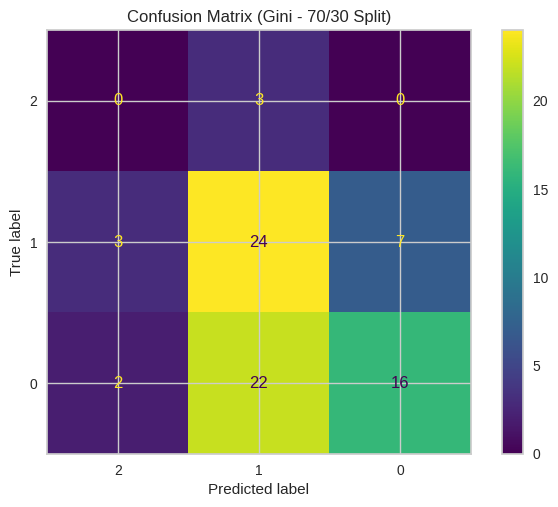

In [98]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Print the confusion matrix
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred_gini)
print(cm)

# Evaluating the model

print("Accuracy:", metrics.accuracy_score(y_test, y_pred_gini))

TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]
TP = cm[1, 1]

sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
precision = TP / (TP + FP)

print("Sensitivity:", sensitivity)
print("Specificity:", specificity)
print("Precision:", precision)

from sklearn.metrics import ConfusionMatrixDisplay
cn = [str(c) for c in df['Adaptivity Level'].unique()]

# Create a confusion matrix display object
disp = ConfusionMatrixDisplay.from_estimator(dt_gini, X_test, y_test, display_labels=cn)
plt.title("Confusion Matrix (Gini - 70/30 Split)")
plt.show()


**Accuracy=51.9%**

The diagonal elements (0, 24, 16) represent the correctly classified samples for each class (moderate,low, high).

The model performs best for the Low class (label = 1) with 24 correct predictions.

There is noticeable confusion between class 0 (High) and class 1 (Low), where several “High” adaptivity students are predicted as “Low” (22 misclassified)

In [99]:
#Visualizing and Saving Decision Tree
from sklearn import tree
#Setting dpi=1000 to make the image clearer
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(15,10),dpi=1000)
tree.plot_tree(dt_gini,feature_names=fn,class_names=cn,filled=True)

[Text(0.5694444444444444, 0.9375, 'Class Duration <= 0.5\ngini = 0.597\nsamples = 179\nvalue = [21, 80, 78]\nclass = 1'),
 Text(0.3333333333333333, 0.8125, 'IT Student <= 0.5\ngini = 0.584\nsamples = 139\nvalue = [15.0, 70.0, 54.0]\nclass = 1'),
 Text(0.45138888888888884, 0.875, 'True  '),
 Text(0.18888888888888888, 0.6875, 'Network Type <= 0.5\ngini = 0.553\nsamples = 105\nvalue = [10, 60, 35]\nclass = 1'),
 Text(0.16666666666666666, 0.5625, 'gini = 0.0\nsamples = 3\nvalue = [0, 3, 0]\nclass = 1'),
 Text(0.2111111111111111, 0.5625, 'Education Level <= 0.5\ngini = 0.56\nsamples = 102\nvalue = [10, 57, 35]\nclass = 1'),
 Text(0.08888888888888889, 0.4375, 'Network Type <= 1.5\ngini = 0.459\nsamples = 28\nvalue = [0, 18, 10]\nclass = 1'),
 Text(0.044444444444444446, 0.3125, 'Load-shedding <= 0.5\ngini = 0.48\nsamples = 10\nvalue = [0, 6, 4]\nclass = 1'),
 Text(0.022222222222222223, 0.1875, 'gini = 0.408\nsamples = 7\nvalue = [0, 5, 2]\nclass = 1'),
 Text(0.06666666666666667, 0.1875, 'gini

The tree starts by splitting on Class Duration because this was the feature that separated the data the best at the beginning. After that, it keeps using IT Student, Network Type, Education Level, and Load-shedding to try to separate the classes.

But none of these features give a strong or clear split, so the tree keeps growing and becomes big and messy. This shows that the data doesn’t have strong patterns, and the model is just trying many small splits to reduce impurity.

## Entropy


In [100]:
#Build Decision Tree Model (Information Gain)
dt_entropy = DecisionTreeClassifier(criterion="entropy")
dt_entropy.fit(X_train, y_train)
#Predict the respones for test dataset
y_pred_entropy = dt_entropy.predict(X_test)

Confusion Matrix:
[[ 0  3  0]
 [ 3 24  7]
 [ 2 22 16]]
Accuracy: 0.5194805194805194
Sensitivity: 0.8888888888888888
Specificity: 0.0
Precision: 0.8888888888888888


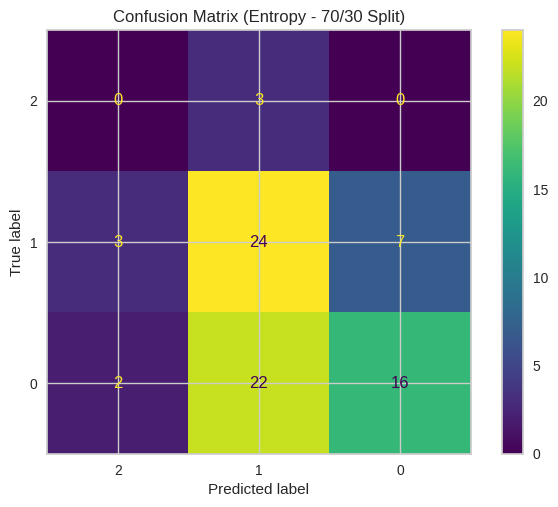

In [101]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt


# Print the confusion matrix
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred_entropy)
print(cm)

# Evaluating the model
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_entropy))

TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]
TP = cm[1, 1]

sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
precision = TP / (TP + FP)

print("Sensitivity:", sensitivity)
print("Specificity:", specificity)
print("Precision:", precision)

from sklearn.metrics import ConfusionMatrixDisplay
cn = [str(c) for c in df['Adaptivity Level'].unique()]

# Create a confusion matrix display object
disp = ConfusionMatrixDisplay.from_estimator(dt_entropy, X_test, y_test, display_labels=cn)
plt.title("Confusion Matrix (Entropy - 70/30 Split)")
plt.show()


**Accuracy=51.9%**

The diagonal elements (0, 24, 16) represent the correctly classified samples for each class  (moderate,low, high).

The model performs best for the Low class (label = 1) with 24 correct predictions.

There is noticeable confusion between class 0 (High) and class 1 (Low), where several “High” adaptivity students are predicted as “Low” (22 misclassified)


In [102]:
#Visualizing and Saving Decision Tree
from sklearn import tree
#Setting dpi=1000 to make the image clearer
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(15,10),dpi=1000)
tree.plot_tree(dt_entropy,feature_names=fn,class_names=cn,filled=True)

[Text(0.5353260869565217, 0.9375, 'Class Duration <= 0.5\nentropy = 1.404\nsamples = 179\nvalue = [21, 80, 78]\nclass = 1'),
 Text(0.2608695652173913, 0.8125, 'Education Level <= 0.5\nentropy = 1.375\nsamples = 139\nvalue = [15.0, 70.0, 54.0]\nclass = 1'),
 Text(0.39809782608695654, 0.875, 'True  '),
 Text(0.08695652173913043, 0.6875, 'Network Type <= 0.5\nentropy = 0.946\nsamples = 33\nvalue = [0, 21, 12]\nclass = 1'),
 Text(0.06521739130434782, 0.5625, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1, 0]\nclass = 1'),
 Text(0.10869565217391304, 0.5625, 'IT Student <= 0.5\nentropy = 0.954\nsamples = 32\nvalue = [0, 20, 12]\nclass = 1'),
 Text(0.08695652173913043, 0.4375, 'Network Type <= 1.5\nentropy = 0.94\nsamples = 28\nvalue = [0, 18, 10]\nclass = 1'),
 Text(0.043478260869565216, 0.3125, 'Load-shedding <= 0.5\nentropy = 0.971\nsamples = 10\nvalue = [0, 6, 4]\nclass = 1'),
 Text(0.021739130434782608, 0.1875, 'entropy = 0.863\nsamples = 7\nvalue = [0, 5, 2]\nclass = 1'),
 Text(0.0652173913

This entropy-based decision tree uses Class Duration as the first split, meaning it gave the highest information gain in the entire dataset. After that, the tree keeps splitting using IT Student, Network Type, Education Level, and Load-shedding.

The splits are small and inconsistent because none of the features provide a strong pattern. That’s why the tree becomes large, with many branches trying to reduce entropy little by little.

## Evaluation:


Both the Gini Index and Entropy (Information Gain) models achieved the same results.



**Accuracy**: measures the proportion of correct predictions made by the model. In this case, the model’s accuracy is approximately 51.9%

**Error Rate**: represents the proportion of incorrect predictions out of all predictions. Given the accuracy, the error rate is about 48.1%.

**Sensitivity** (Recall): measures how many actual positive cases are correctly identified by the model. Here, the sensitivity is very high at approximately 88.9%, meaning the model successfully captures most positive cases.

**Specificity:** measures how many actual negative cases are correctly identified. In this scenario, the specificity is 0%, indicating the model failed to correctly identify any negative cases.

**Precision:** represents the proportion of positive predictions that were actually correct. The precision is approximately 88.9%, showing that when the model predicts a positive case, it is correct most of the time.


# 2-Splitting dataset into 80% Training and 20% Testing

In [103]:
# Split dataset into 80% Training and 20% Testing
# random_state ensures reproducible results
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



print("Training set size:", X_train.shape)
print("Testing set size:", X_test.shape)

Training set size: (204, 5)
Testing set size: (52, 5)


training set is 204 rows and testing is 52 row

## Gini index

In [104]:
#Build Decision Tree Model (Gini Index)
# Model using Gini Index
dt_gini = DecisionTreeClassifier()
dt_gini=dt_gini.fit(X_train, y_train)
#Predict the respones for test dataset
y_pred_gini = dt_gini.predict(X_test)

Confusion Matrix:
[[ 0  1  1]
 [ 3  8  9]
 [ 2  8 20]]
Accuracy: 0.5384615384615384
Sensitivity: 0.7272727272727273
Specificity: 0.0
Precision: 0.8888888888888888


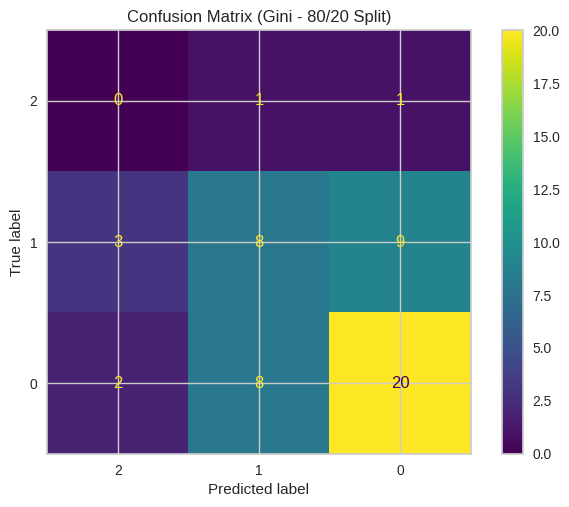

In [105]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt


# Print the confusion matrix
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred_gini)   # ← FIX ADDED HERE
print(cm)

# Evaluating the model
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_gini))
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]
TP = cm[1, 1]

sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
precision = TP / (TP + FP)

print("Sensitivity:", sensitivity)
print("Specificity:", specificity)
print("Precision:", precision)

from sklearn.metrics import ConfusionMatrixDisplay
cn = [str(c) for c in df['Adaptivity Level'].unique()]

# Create a confusion matrix display object
disp = ConfusionMatrixDisplay.from_estimator(dt_gini, X_test, y_test, display_labels=cn)
plt.title("Confusion Matrix (Gini - 80/20 Split)")
plt.show()


**Accuracy= 53.8%**

The diagonal elements (0, 8, 20) represent the correctly classified samples for each class  (moderate,low, high).

The model performs best for the High class (label = 0) with 20 correct predictions, followed by the Low class (label = 1) with 8 correct predictions.
However, it completely fails to classify the Moderate class (label = 2), as none of its samples were predicted correctly.

In [106]:
#Visualizing and Saving Decision Tree
from sklearn import tree
#Setting dpi=1000 to make the image clearer
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(10,10),dpi=1000)
tree.plot_tree(dt_gini,feature_names=fn,class_names=cn,filled=True)

[Text(0.5790816326530612, 0.9375, 'Class Duration <= 0.5\ngini = 0.59\nsamples = 204\nvalue = [22, 94, 88]\nclass = 1'),
 Text(0.336734693877551, 0.8125, 'IT Student <= 0.5\ngini = 0.578\nsamples = 161\nvalue = [16.0, 82.0, 63.0]\nclass = 1'),
 Text(0.45790816326530615, 0.875, 'True  '),
 Text(0.17346938775510204, 0.6875, 'Network Type <= 0.5\ngini = 0.55\nsamples = 118\nvalue = [11, 68, 39]\nclass = 1'),
 Text(0.15306122448979592, 0.5625, 'gini = 0.0\nsamples = 5\nvalue = [0, 5, 0]\nclass = 1'),
 Text(0.19387755102040816, 0.5625, 'Education Level <= 0.5\ngini = 0.561\nsamples = 113\nvalue = [11, 63, 39]\nclass = 1'),
 Text(0.08163265306122448, 0.4375, 'Network Type <= 1.5\ngini = 0.464\nsamples = 30\nvalue = [0, 19, 11]\nclass = 1'),
 Text(0.04081632653061224, 0.3125, 'Load-shedding <= 0.5\ngini = 0.48\nsamples = 10\nvalue = [0, 6, 4]\nclass = 1'),
 Text(0.02040816326530612, 0.1875, 'gini = 0.408\nsamples = 7\nvalue = [0, 5, 2]\nclass = 1'),
 Text(0.061224489795918366, 0.1875, 'gini =

This Gini-based decision tree starts with Class Duration as the first split, meaning this feature provided the strongest separation between the classes in the 80% training data. After that, the tree continues splitting using the same main attributes as before—IT Student, Network Type, Education Level, and Load-shedding.

The structure still looks large and mixed, which shows that the dataset doesn't have clear or strong patterns. The tree needs many small splits to reduce impurity.

## Entropy

In [107]:
#Build Decision Tree Model (Information Gain)
dt_entropy = DecisionTreeClassifier(criterion="entropy")
dt_entropy.fit(X_train, y_train)
#Predict the respones for test dataset
y_pred_entropy = dt_entropy.predict(X_test)

Confusion Matrix:
[[ 0  1  1]
 [ 3  8  9]
 [ 2  8 20]]
Accuracy: 0.5384615384615384
Sensitivity: 0.7272727272727273
Specificity: 0.0
Precision: 0.8888888888888888


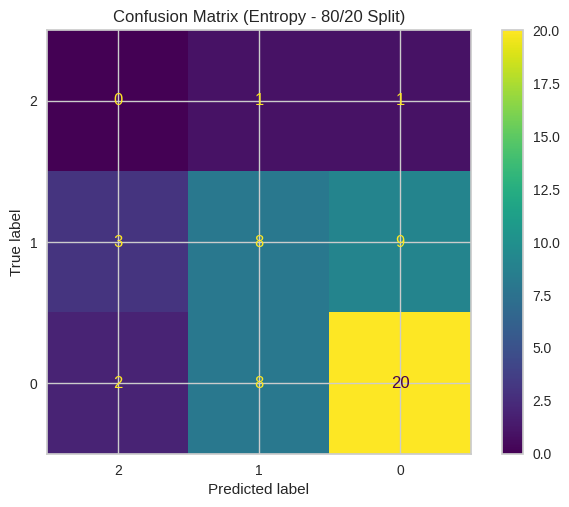

In [108]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Print the confusion matrix
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred_entropy)   # ← FIX ADDED HERE
print(cm)

# Evaluating the model
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_entropy))

TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]
TP = cm[1, 1]

sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
precision = TP / (TP + FP)

print("Sensitivity:", sensitivity)
print("Specificity:", specificity)
print("Precision:", precision)

from sklearn.metrics import ConfusionMatrixDisplay
cn = [str(c) for c in df['Adaptivity Level'].unique()]

# Create a confusion matrix display object
disp = ConfusionMatrixDisplay.from_estimator(dt_entropy, X_test, y_test, display_labels=cn)
plt.title("Confusion Matrix (Entropy - 80/20 Split)")
plt.show()


**Accuracy =53.8%**

The diagonal elements (0, 8, 20) represent the correctly classified samples for each class  (moderate,low, high).

The model performs best for the High class (label =0), with 20 correct predictions, followed by the Low class (label = 1), with 8 correct predictions.
Similar to the Gini model, it fails to correctly classify any samples from the Moderate class (label = 2), showing poor distinction for that category.

In [109]:
#Visualizing and Saving Decision Tree
from sklearn import tree
#Setting dpi=1000 to make the image clearer
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(10,10),dpi=1000)
tree.plot_tree(dt_entropy,feature_names=fn,class_names=cn,filled=True)

[Text(0.532608695652174, 0.9375, 'Class Duration <= 0.5\nentropy = 1.385\nsamples = 204\nvalue = [22, 94, 88]\nclass = 1'),
 Text(0.2554347826086957, 0.8125, 'Education Level <= 0.5\nentropy = 1.356\nsamples = 161\nvalue = [16.0, 82.0, 63.0]\nclass = 1'),
 Text(0.3940217391304348, 0.875, 'True  '),
 Text(0.08695652173913043, 0.6875, 'Network Type <= 0.5\nentropy = 0.961\nsamples = 39\nvalue = [0, 24, 15]\nclass = 1'),
 Text(0.06521739130434782, 0.5625, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1, 0]\nclass = 1'),
 Text(0.10869565217391304, 0.5625, 'IT Student <= 0.5\nentropy = 0.968\nsamples = 38\nvalue = [0, 23, 15]\nclass = 1'),
 Text(0.08695652173913043, 0.4375, 'Network Type <= 1.5\nentropy = 0.948\nsamples = 30\nvalue = [0, 19, 11]\nclass = 1'),
 Text(0.043478260869565216, 0.3125, 'Load-shedding <= 0.5\nentropy = 0.971\nsamples = 10\nvalue = [0, 6, 4]\nclass = 1'),
 Text(0.021739130434782608, 0.1875, 'entropy = 0.863\nsamples = 7\nvalue = [0, 5, 2]\nclass = 1'),
 Text(0.06521739130

This entropy tree starts with Class Duration, which means it gave the highest information gain in the training data. After that, the tree keeps splitting using Load-shedding, IT Student, Network Type, and Education Level. These features don't provide strong or clean separation, so the tree keeps growing deeper and makes many small splits to reduce entropy.

## Evaluation:

Both the Gini Index and Entropy (Information Gain) models achieved the same results.

**Accuracy:** represents the proportion of total predictions that were correct. In this case, the model achieved an accuracy of approximately 53.8%, meaning it correctly classified a little more than half of the instances.

**Error Rate:** is the proportion of incorrect predictions. Since accuracy is 53.8%, the error rate is about 46.2%, indicating that nearly half of the predictions were wrong.

**Sensitivity** (Recall): measures how effectively the model identifies actual positive cases for the class being evaluated. The sensitivity is approximately 72.7%, showing the model is fairly successful at detecting positive instances of the chosen class.

**Specificity:** reflects how well the model identifies actual negative cases (those not belonging to the positive class). In this scenario, the specificity is 0%, meaning the model was not able to correctly identify any negative cases for the selected class.

**Precision:** represents the proportion of predicted positive cases that were actually correct. The precision is approximately 88.9%, indicating that when the model predicts a positive instance, it is usually accurate.

#3-Splitting dataset into 90% Training and 10% Testing

In [110]:
# Split dataset into 90% Training and 10% Testing
# random_state ensures reproducible results
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)



print("Training set size:", X_train.shape)
print("Testing set size:", X_test.shape)

Training set size: (230, 5)
Testing set size: (26, 5)


training set is 230 rows and testing set is 26 rows

## Gini Index

In [111]:
#Build Decision Tree Model (Gini Index)

# Model using Gini Index
dt_gini = DecisionTreeClassifier()
dt_gini=dt_gini.fit(X_train, y_train)
#Predict the respones for test dataset
y_pred_gini = dt_gini.predict(X_test)

Confusion Matrix:
[[0 0 1]
 [0 5 4]
 [2 7 7]]
Accuracy: 0.46153846153846156
Sensitivity: 1.0
Specificity: 0
Precision: 1.0


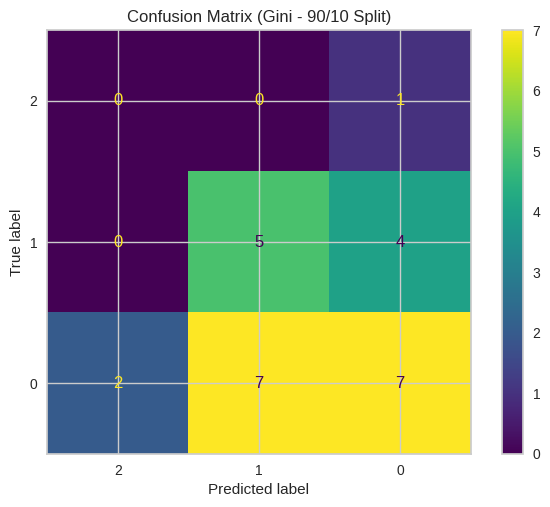

In [112]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt


# Print the confusion matrix
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred_gini)   # ← FIX ADDED HERE
print(cm)

# Evaluating the model
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_gini))

TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]
TP = cm[1, 1]

sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP) if (TN + FP) != 0 else 0 #added because specificity here is nan
precision = TP / (TP + FP)

print("Sensitivity:", sensitivity)
print("Specificity:", specificity)
print("Precision:", precision)

from sklearn.metrics import ConfusionMatrixDisplay
cn = [str(c) for c in df['Adaptivity Level'].unique()]

# Create a confusion matrix display object
disp = ConfusionMatrixDisplay.from_estimator(
    dt_gini,
    X_test,
    y_test,
    display_labels=cn
)

plt.title("Confusion Matrix (Gini - 90/10 Split)")
plt.show()


**Accuracy =46.1%**

The diagonal elements (0, 5, 7) represent the correctly classified samples for each class  (moderate,low, high).

The model performs best for the High class (label =0), with 7 correct predictions, followed by the Low class (label = 1), with 5 correct predictions.
 it fails to correctly classify any samples from the Moderate class (label = 2), showing poor distinction for that category.

In [113]:
#Visualizing and Saving Decision Tree
from sklearn import tree
#Setting dpi=1000 to make the image clearer
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(10,10),dpi=1000)
tree.plot_tree(dt_gini,feature_names=fn,class_names=cn,filled=True)

[Text(0.5790816326530612, 0.9375, 'Class Duration <= 0.5\ngini = 0.585\nsamples = 230\nvalue = [23, 105, 102]\nclass = 1'),
 Text(0.336734693877551, 0.8125, 'IT Student <= 0.5\ngini = 0.575\nsamples = 183\nvalue = [17, 92, 74]\nclass = 1'),
 Text(0.45790816326530615, 0.875, 'True  '),
 Text(0.17346938775510204, 0.6875, 'Network Type <= 0.5\ngini = 0.551\nsamples = 135\nvalue = [12, 77, 46]\nclass = 1'),
 Text(0.15306122448979592, 0.5625, 'gini = 0.0\nsamples = 5\nvalue = [0, 5, 0]\nclass = 1'),
 Text(0.19387755102040816, 0.5625, 'Education Level <= 0.5\ngini = 0.56\nsamples = 130\nvalue = [12, 72, 46]\nclass = 1'),
 Text(0.08163265306122448, 0.4375, 'Network Type <= 1.5\ngini = 0.457\nsamples = 34\nvalue = [0, 22, 12]\nclass = 1'),
 Text(0.04081632653061224, 0.3125, 'Load-shedding <= 0.5\ngini = 0.473\nsamples = 13\nvalue = [0, 8, 5]\nclass = 1'),
 Text(0.02040816326530612, 0.1875, 'gini = 0.408\nsamples = 7\nvalue = [0, 5, 2]\nclass = 1'),
 Text(0.061224489795918366, 0.1875, 'gini = 0

This Gini-based tree again starts with Class Duration, which means this feature gives the best split and reduces impurity the most at the top level. After that, the model continues splitting using features like IT Student, Network Type, Education Level, and Load-shedding.

The tree grows large because none of the features provides a strong or clean separation between the classes. The model keeps creating many small splits to try to make the groups more pure. This shows that the dataset has weak patterns and no dominant predictor. That’s also why the final accuracy remains low even though the training size changed

## Entropy

In [114]:
#Build Decision Tree Model (Information Gain)
dt_entropy = DecisionTreeClassifier(criterion="entropy")
dt_entropy.fit(X_train, y_train)
#Predict the respones for test dataset
y_pred_entropy = dt_entropy.predict(X_test)

Confusion Matrix:
[[0 0 1]
 [0 5 4]
 [2 7 7]]
Accuracy: 0.46153846153846156
Sensitivity: 1.0
Specificity: 0
Precision: 1.0


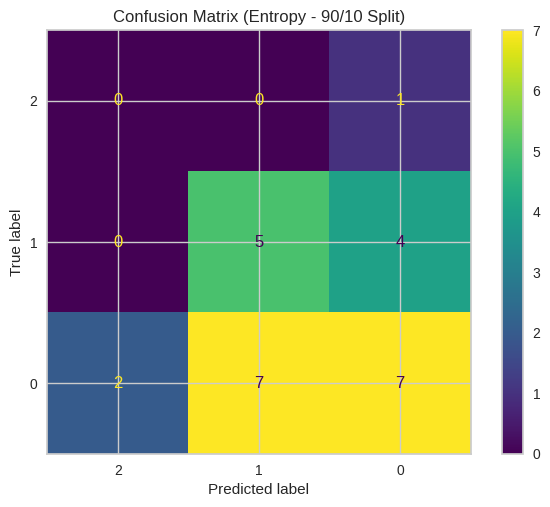

In [115]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Print the confusion matrix
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred_entropy)
print(cm)

# Evaluating the model

print("Accuracy:", metrics.accuracy_score(y_test, y_pred_entropy))

TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]
TP = cm[1, 1]

sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP) if (TN + FP) != 0 else 0 #added because specificity here is nan
precision   = TP / (TP + FP)

print("Sensitivity:", sensitivity)
print("Specificity:", specificity)
print("Precision:", precision)

from sklearn.metrics import ConfusionMatrixDisplay
cn = [str(c) for c in df['Adaptivity Level'].unique()]

# Create a confusion matrix display object
disp = ConfusionMatrixDisplay.from_estimator(
    dt_entropy,
    X_test,
    y_test,
    display_labels=cn
)

plt.title("Confusion Matrix (Entropy - 90/10 Split)")
plt.show()


**Accuracy =46.1%**

The diagonal elements (0, 5, 7) represent the correctly classified samples for each class  (moderate,low, high).

The model performs best for the High class (label =0), with 7 correct predictions, followed by the Low class (label = 1), with 5 correct predictions.
 it fails to correctly classify any samples from the Moderate class (label = 2), showing poor distinction for that category.

In [116]:
#Visualizing and Saving Decision Tree
from sklearn import tree
#Setting dpi=1000 to make the image clearer
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(15,10),dpi=1000)
tree.plot_tree(dt_entropy,feature_names=fn,class_names=cn,filled=True)

[Text(0.532608695652174, 0.9375, 'Class Duration <= 0.5\nentropy = 1.369\nsamples = 230\nvalue = [23, 105, 102]\nclass = 1'),
 Text(0.2554347826086957, 0.8125, 'Education Level <= 0.5\nentropy = 1.345\nsamples = 183\nvalue = [17, 92, 74]\nclass = 1'),
 Text(0.3940217391304348, 0.875, 'True  '),
 Text(0.08695652173913043, 0.6875, 'Network Type <= 0.5\nentropy = 0.952\nsamples = 43\nvalue = [0, 27, 16]\nclass = 1'),
 Text(0.06521739130434782, 0.5625, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1, 0]\nclass = 1'),
 Text(0.10869565217391304, 0.5625, 'IT Student <= 0.5\nentropy = 0.959\nsamples = 42\nvalue = [0, 26, 16]\nclass = 1'),
 Text(0.08695652173913043, 0.4375, 'Network Type <= 1.5\nentropy = 0.937\nsamples = 34\nvalue = [0, 22, 12]\nclass = 1'),
 Text(0.043478260869565216, 0.3125, 'Load-shedding <= 0.5\nentropy = 0.961\nsamples = 13\nvalue = [0, 8, 5]\nclass = 1'),
 Text(0.021739130434782608, 0.1875, 'entropy = 0.863\nsamples = 7\nvalue = [0, 5, 2]\nclass = 1'),
 Text(0.065217391304347

This entropy-based tree starts with Class Duration, meaning this feature provided the highest information gain at the root. After that, the tree continues splitting using Education Level, Network Type, IT Student, and Load-shedding. These features don’t strongly separate the classes, so the tree ends up with many small and weak splits.

The tree becomes large and mixed because the dataset does not contain strong patterns. Most of the leaves still have a mix of classes, which shows that each split only reduces entropy a little.

## Evaluation:

Both the Gini Index and Entropy (Information Gain) models achieved the same results.

**Accuracy:** represents the proportion of all predictions that the model correctly classified. In this case, the model achieved an accuracy of approximately 46.15%, meaning it correctly predicted less than half of the instances.

**Error Rate:**  the proportion of incorrect predictions. Since the accuracy is 46.15%, the error rate is about 53.85%, meaning more than half of the predictions were wrong.

**Sensitivity (Recall):** measures how effectively the model identifies true positive cases for the evaluated class. Here, sensitivity is 100%, meaning the model correctly detected all actual positive instances of the target class.

**Specificity:** indicates how well the model identifies true negative cases (cases that do not belong to the evaluated class). In this result, specificity is 0, because the model did not correctly identify any negative cases.
The value became NaN originally because the denominator (TN + FP) was zero, meaning the model never predicted the negative class — this makes specificity mathematically undefined, so it is treated as 0.

**Precision:** measures the proportion of predicted positive cases that were actually correct. The precision is 100%, showing that every instance predicted as positive was truly positive.


# Classification Table:
The Gini and Entropy decision tree classifiers were evaluated using three train–test splits (70/30, 80/20, and 90/10).
The following **table** summarizes their performance:

|           | 90% training, 10% testing | 80% training, 20% testing | 70% training, 30% testing |
| --------------- | ------------------------- | ------------------------- | ------------------------- |
| **Accuracy**    |  0.4615                    | 0.5385                    | 0.5195                    |
| **Error Rate**  |  0.5385                    | 0.4615                    | 0.4805                    |
| **Sensitivity** |  1.0000                    | 0.7273                    | 0.8889                    |
| **Specificity** |  0.0000                    | 0.0000                    | 0.0000                    |
| **Precision**   |  1.0000                    | 0.8889                    | 0.8889                    |


Both Gini and Entropy achieved exactly the same results for all splits. This means accuracy, sensitivity, specificity, precision, and confusion matrices were identical under both algorithms for each partition.

**1- The algorithm who performs best for each partition based on the evaluation
metrics:**

Since Gini and Entropy produced identical results across all partitions,
 Neither algorithm outperforms the other in any split.
They behave the same because both measures (Gini impurity and entropy) chose the same splits in the dataset.


**2- The algorithm that performs best overall:**

Because both algorithms yield identical:

*Accuracy*

*Error Rate*

*Sensitivity*

*Specificity*

*Precision*

*Confusion matrices*

Both algorithms perform equally well overall.

There is no difference in model quality or predictive power between Gini and Entropy on this dataset.


**Insights:**

*Accuracy:*

Best accuracy was achieved in the 80/20 split (53.85%).

This means the model performs better with a moderate amount of training data and a slightly larger test set.

*Sensitivity:*

All splits show high sensitivity, meaning the model detects positive cases very well.

In the 90/10 split, sensitivity is 1.0, meaning no positive cases were missed.

*Precision:*

High precision in all splits (0.88–1.0), meaning predicted positives are usually correct.

*Specificity:*

Specificity is 0 across all splits, showing the model struggles to correctly identify negative cases.

This indicates class imbalance or overlapping features.

# **Clustering**

## K-means Clustering

Load librarys & Prepare Features

In [117]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import SilhouetteVisualizer

# Load the preprocessed dataset
df = pd.read_csv("/content/Reduced_dataset.csv")

# Remove target column (Adaptivity Level) - clustering is unsupervised
X = df.drop(['Adaptivity Level'], axis=1)

# Scale the data
X_scaled = X

# 1-Silhouette method:

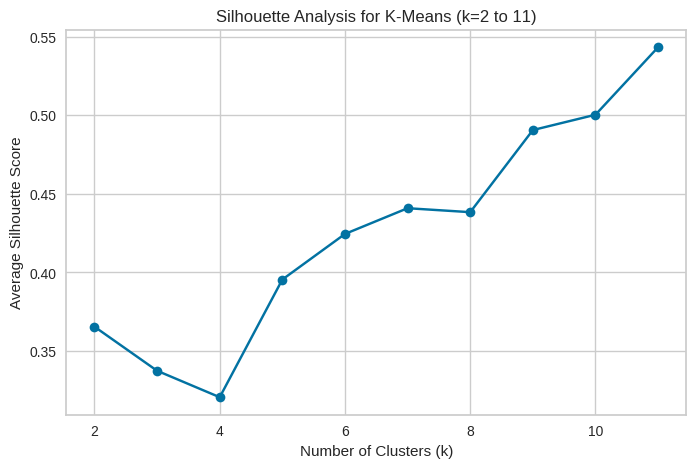

The highest silhouette score is 0.5434 at k = 11
The second highest silhouette score is 0.5004 at k = 10


In [118]:
k_values = range(2, 12)
silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, labels)
    silhouette_scores.append(score)

# Find best and second-best K
best_k = k_values[np.argmax(silhouette_scores)]
sorted_scores = sorted(silhouette_scores, reverse=True)
second_best_score = sorted_scores[1]
second_best_k = k_values[silhouette_scores.index(second_best_score)]

# Plot Silhouette scores
plt.figure(figsize=(8,5))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title("Silhouette Analysis for K-Means (k=2 to 11)")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Average Silhouette Score")
plt.grid(True)
plt.show()

print(f"The highest silhouette score is {max(silhouette_scores):.4f} at k = {best_k}")
print(f"The second highest silhouette score is {second_best_score:.4f} at k = {second_best_k}")


# 2-Elbow Method:

NameError: name 'wss_values' is not defined

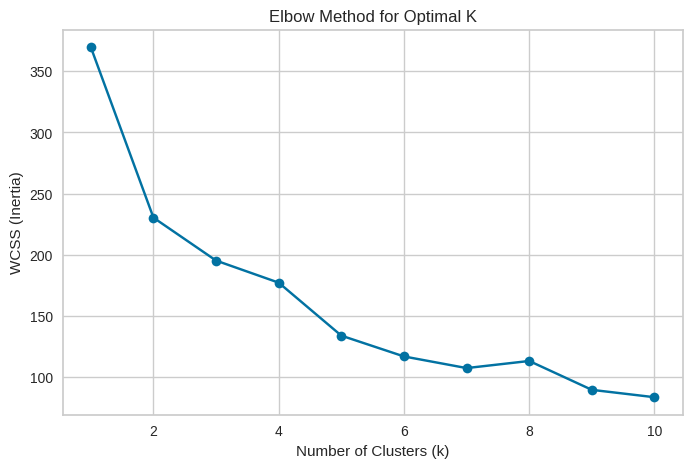

In [119]:
!pip install kneed
from kneed import KneeLocator

wcss = []
k_values = range(1, 11)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8,5))
plt.plot(k_values, wcss, marker='o')
plt.title("Elbow Method for Optimal K")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("WCSS (Inertia)")
plt.grid(True)

# Use KneeLocator to find the optimal k (elbow point)
knee = KneeLocator(k_values, wss_values, curve='convex', direction='decreasing')
optimal_k = knee.elbow
# Draw a vertical line at the elbow
plt.axvline(x=optimal_k, linestyle='--', color='red', label='Chosen k = {optimal_k}')
plt.legend()
plt.show()


From the Elbow plot, the curve starts to level off at **K = 5**..  
This means that adding more clusters after 5 doesn’t make a big improvement.  
So, **K = 5** is chosen as the best number of clusters for this dataset.

## **K = 3**

In [ ]:
# K-means with K = 3
np.random.seed(42)

# Perform K-means clustering for K=3
kmeans = KMeans(n_clusters=3, random_state=42, n_init='auto')
kmeans_result = kmeans.fit(X_scaled)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)




In [ ]:
kmeans = KMeans(n_clusters=3, n_init='auto', random_state=42)
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(X_scaled)
visualizer.show()


In [ ]:
# Calculate the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score

# Perform k-means clustering with k=3
kmeans = KMeans(n_clusters=3, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X_scaled, labels)

# Print the evaluation metrics
print(f"WSS: {wss}")
print(f"Average Silhouette Score: {silhouette_avg}")


## *K = 3 Analyisis*

For K = 3, the WSS value of 195.31 indicates that the clusters are reasonably compact.
The Average Silhouette Score of 0.337 is moderate, showing:
 • Good internal cohesion within clusters
 • Decent separation between clusters
 • Less overlap compared to higher K values

Although the silhouette score is not very high, it is still a meaningful clustering structure.

# K = 4

In [ ]:
np.random.seed(42)

# Perform K-means clustering for K=4
kmeans = KMeans(n_clusters=4, random_state=42, n_init='auto')
kmeans_result = kmeans.fit(X_scaled)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)


In [ ]:
# Silhouette Plot for K=4
kmeans = KMeans(n_clusters=4, n_init='auto', random_state=42)
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(X_scaled)
visualizer.show()


In [ ]:
# Calculate the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score

# Perform k-means clustering with k=4
kmeans = KMeans(n_clusters=4, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X_scaled, labels)

# Print the evaluation metrics
print(f"WSS: {wss}")
print(f"Average Silhouette Score: {silhouette_avg}")


## Analysis of K = 4


For K = 4, WSS decreases to 177.27, meaning the clusters become more compact.
However, the Silhouette Score drops to 0.3209, which is:
 • Slightly lower than K = 3
 • Still moderate
 • Indicates that clusters start to overlap more

This shows that adding a fourth cluster:
 • Improves compactness
 • But reduces separation quality

# k = 5

In [ ]:
np.random.seed(42)

# Perform K-means clustering for K=5
kmeans = KMeans(n_clusters=5, random_state=42, n_init='auto')
kmeans_result = kmeans.fit(X_scaled)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)


In [ ]:
# Silhouette Plot for K=5
kmeans = KMeans(n_clusters=5, n_init='auto', random_state=42)
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(X_scaled)
visualizer.show()


In [ ]:
# Calculate the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score

# Perform k-means clustering with k=5
kmeans = KMeans(n_clusters=5, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X_scaled, labels)

# Print the evaluation metrics
print(f"WSS: {wss}")
print(f"Average Silhouette Score: {silhouette_avg}")


## Analysis of K = 5

For K = 5, WSS further decreases to 134.01, showing strong compactness.
The Silhouette Score increases to 0.3955, which is:
 • The highest among all tested K values
 • Indicates better overall cluster quality
 • Shows improved cluster separation
 • Suggests fewer overlapping boundaries

K = 5 gives:
 • The most compact clusters
 • The best separation
 • The most meaningful structure among K = 3, 4, 5

## comparing the results

| Metric                                        | **K = 3**  | **K = 4**  | **K = 5**  |
| --------------------------------------------- | ---------- | ---------- | ---------- |
| **Average Silhouette Width**                  | **0.3370** | **0.3209** | **0.3955** |
| **Total Within-Cluster Sum of Squares (WSS)** | **195.31** | **177.27** | **134.01** |


K = 3

K=3 gives moderately compact clusters with WSS = 195.31 and a Silhouette Score = 0.3373.
This score is higher than K=4, meaning the clusters in K=3 are better separated and have less overlap.
Overall, K=3 offers a good balance between cohesion and separation.

⸻

K = 4

K=4 reduces WSS further to 177.28, meaning the clusters became slightly tighter.
However, the Silhouette Score drops to 0.3286, which indicates that the clusters overlap more than in K=3.
So, although compactness improved, separation got slightly worse.

⸻

K = 5

K=5 has the lowest WSS = 134.01, meaning it produces the tightest clusters.
But it also gives the highest Silhouette Score = 0.3955, which means cluster separation is the strongest.
This indicates that K=5 provides:
 • The best cohesion (tight clusters)
 • The best separation (least overlap)
 • The clearest and most meaningful structure

## Final dicision:

Based on both WSS and Silhouette results, K = 5 is selected as the best number of clusters.
Although compactness improves gradually from K=3 to K=5, the Silhouette Score shows the largest improvement at K=5, meaning that K=5 provides:
 • The tightest clusters
 • The best separation between clusters
 • The most meaningful and interpretable clustering structure

Therefore, K = 5 is the optimal K for this dataset.

## Findings and Discussion:

## References: